# Batch processing to video for Fast Style Transfer for Arbitrary Styles

Using the model code in magenta: https://github.com/tensorflow/magenta/tree/master/magenta/models/arbitrary_image_stylization

From the TensorFlow Hub: https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2

and the publication:
    Exploring the structure of a real-time, arbitrary neural artistic stylization network. Golnaz Ghiasi, Honglak Lee, Manjunath Kudlur, Vincent Dumoulin, Jonathon Shlens, Proceedings of the British Machine Vision Conference (BMVC), 2017.: https://arxiv.org/abs/1705.06830
    
    
### Description:
This notebook uses imageio to feed frames from videos or images from an image sequence into a Fast Style Transfer for Arbitrary Styles model and write the results to a frame in a new video.

### Clean up GPU dedicated memory, useful after kernel crashes

In [1]:
from numba import cuda
cuda.select_device(0)
cuda.close()

### TensorFlow 

In [2]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.config.list_physical_devices('GPU'))

TF Version:  2.1.0
TF-Hub version:  0.8.0
Eager mode enabled:  True
GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### Widgets, images and time

In [3]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import time
import datetime
import PIL.Image
import imageio

### Progress bar

In [4]:
%%capture
from tqdm import tqdm_notebook as tqdm
tqdm()

### Functions

In [5]:
#########################
# Images
#########################

def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)


def tensor_to_imagelike(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return tensor



def imageprep(path):
    if isinstance(path, str):
        image = plt.imread(path)
    else:
        image = plt.imshow(path)
    return image.astype(np.float32)[np.newaxis, ...] / 255.

def rescale(image,size):
    img = PIL.Image.open(image)
    img.thumbnail((size,size),PIL.Image.ANTIALIAS)
    return img


###################################################
## arbitrary-image-stylisation
###################################################
# https://www.tensorflow.org/hub/tutorials/tf2_arbitrary_image_stylization

hub_module = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')


def StyleTransfer(content_image_path, style_image_path):
    content_image = imageprep(content_image_path)
    style_image = imageprep(style_image_path)
    stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
    return tensor_to_image(stylized_image)

def batch(infolder, outfolder):

    inputs = os.listdir(infolder)
    for in_pic in tqdm(inputs):
        out_pic = StyleTransfer(infolder+in_pic, styles_path+stylepicked)
        #out_pic = PIL.Image.fromarray(plt.imread(infolder+in_pic))
        out_pic.save(outfolder+"style" +in_pic, 'JPEG')


# Pick a style

black white cat.jpg


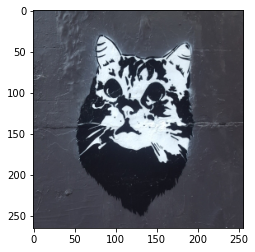

blue swerls.jpg


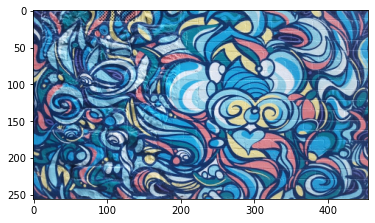

camal snail.jpg


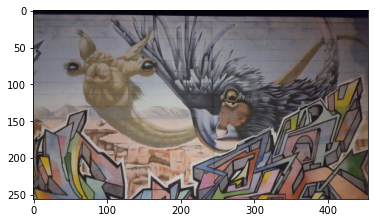

carpet.jpg


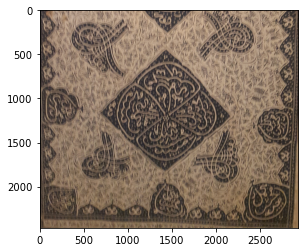

charcoal.jpg


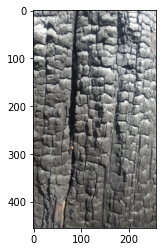

clay_embost.jpg


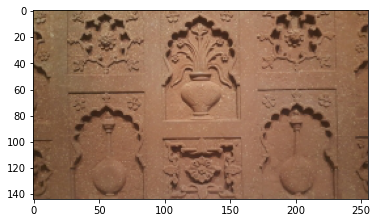

colourd rectangles.jpg


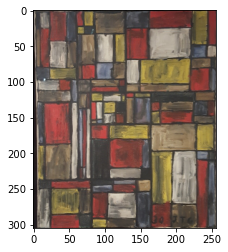

cosmic.jpg


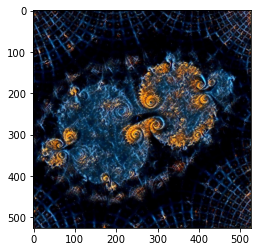

cubic.jpg


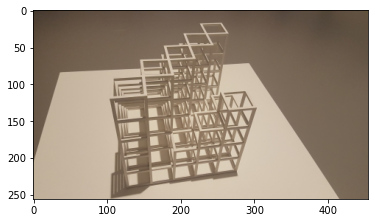

dragon mat.jpg


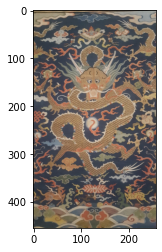

dragon screen.jpg


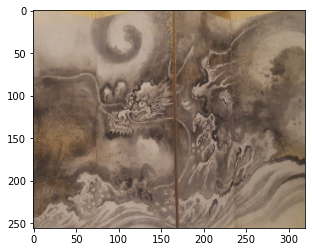

egg.jpg


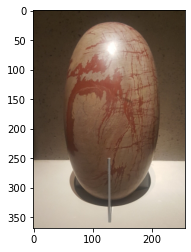

finger painting.jpg


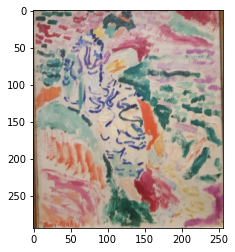

french sea thing.jpg


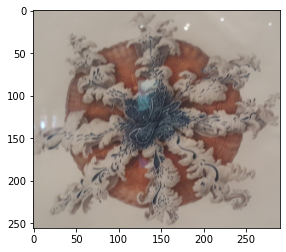

furry rocj.jpg


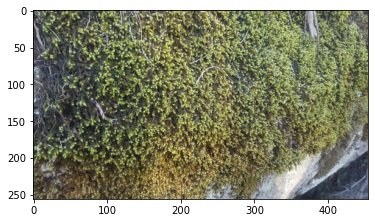

geomertry.jpg


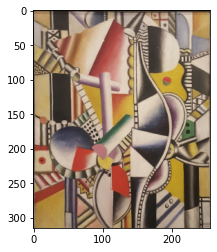

gold chest.jpg


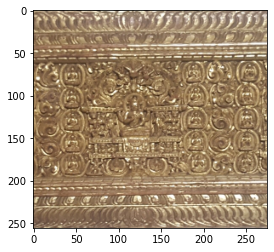

gothic.jpg


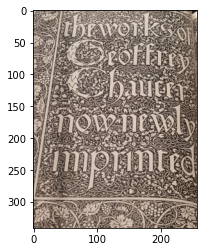

graffti dragon.jpg


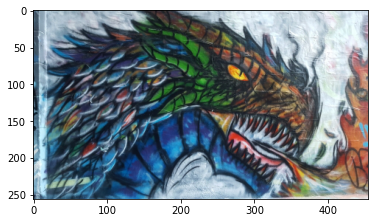

interfereance.jpg


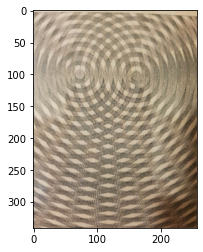

iso.jpg


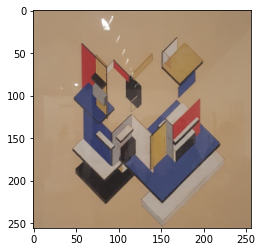

latace.jpg


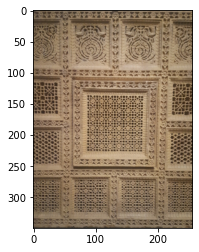

mech dragon.jpg


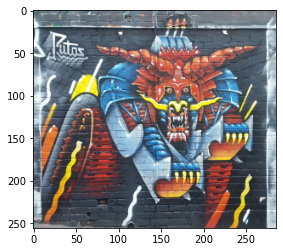

moss close.jpg


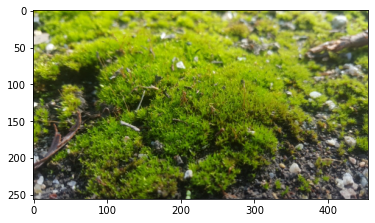

moss.jpg


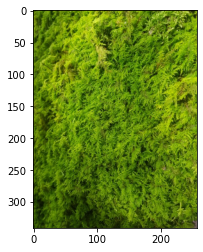

mushroom.jpg


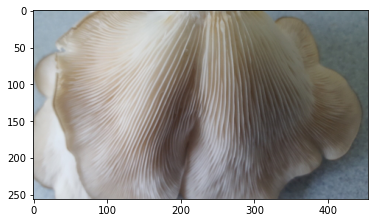

neon frog.jpg


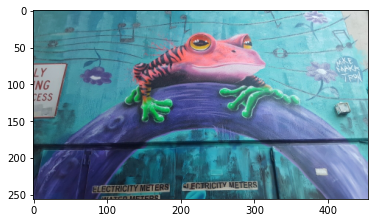

neon lady.jpg


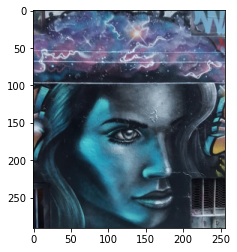

neon orange blue.jpg


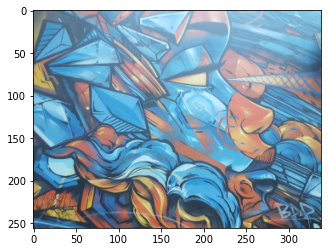

neonknot.jpg


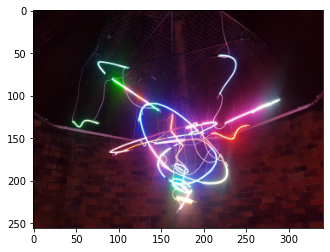

pastals.jpg


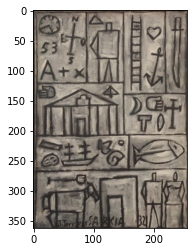

purple leaf.jpg


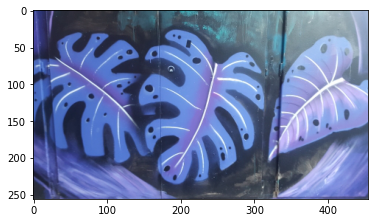

purple splater.jpg


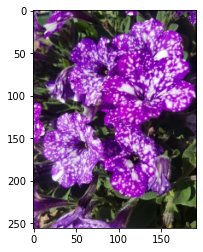

stained glass.jpg


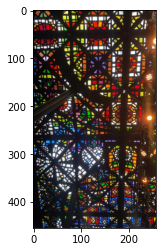

tiger.jpg


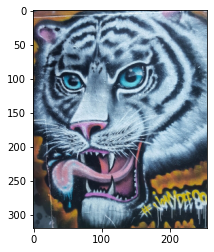

water wall.jpg


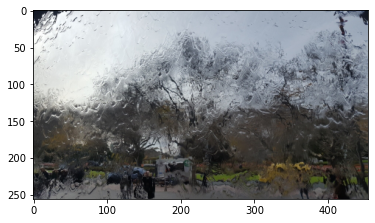

waves.jpg


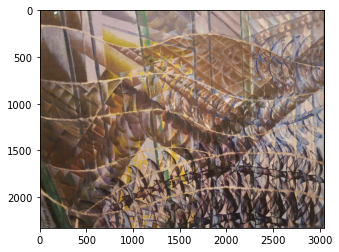

interactive(children=(Dropdown(description='style', options=('black white cat.jpg', 'blue swerls.jpg', 'camal …

In [10]:
styles_path = "styles/"
styles = os.listdir(styles_path)
    
for style in styles:
    print(style)
    styelimage =plt.imread(styles_path+style)
    plt.imshow(styelimage)
    plt.show()

def browse_images(styles):
    n = len(styles)
    def styleimage(style):
        styelimage =plt.imread(styles_path+style)
        #plt.imshow(styelimage)
        print(style)
        global stylepicked
        stylepicked=style
        return plt.imshow(styelimage)
    style_picked =  interact(styleimage, style=styles)

browse_images(styles)

In [11]:
styles_path = "styles/"
styles = os.listdir(styles_path)
    

def browse_images(styles):
    n = len(styles)
    def styleimage(style):
        styelimage =plt.imread(styles_path+style)
        #plt.imshow(styelimage)
        print(style)
        global stylepicked
        stylepicked=style
        return plt.imshow(styelimage)
    style_picked =  interact(styleimage, style=styles)

browse_images(styles)

interactive(children=(Dropdown(description='style', options=('black white cat.jpg', 'blue swerls.jpg', 'camal …

# Batch Style Transfer

## Style Transfer a Single frame

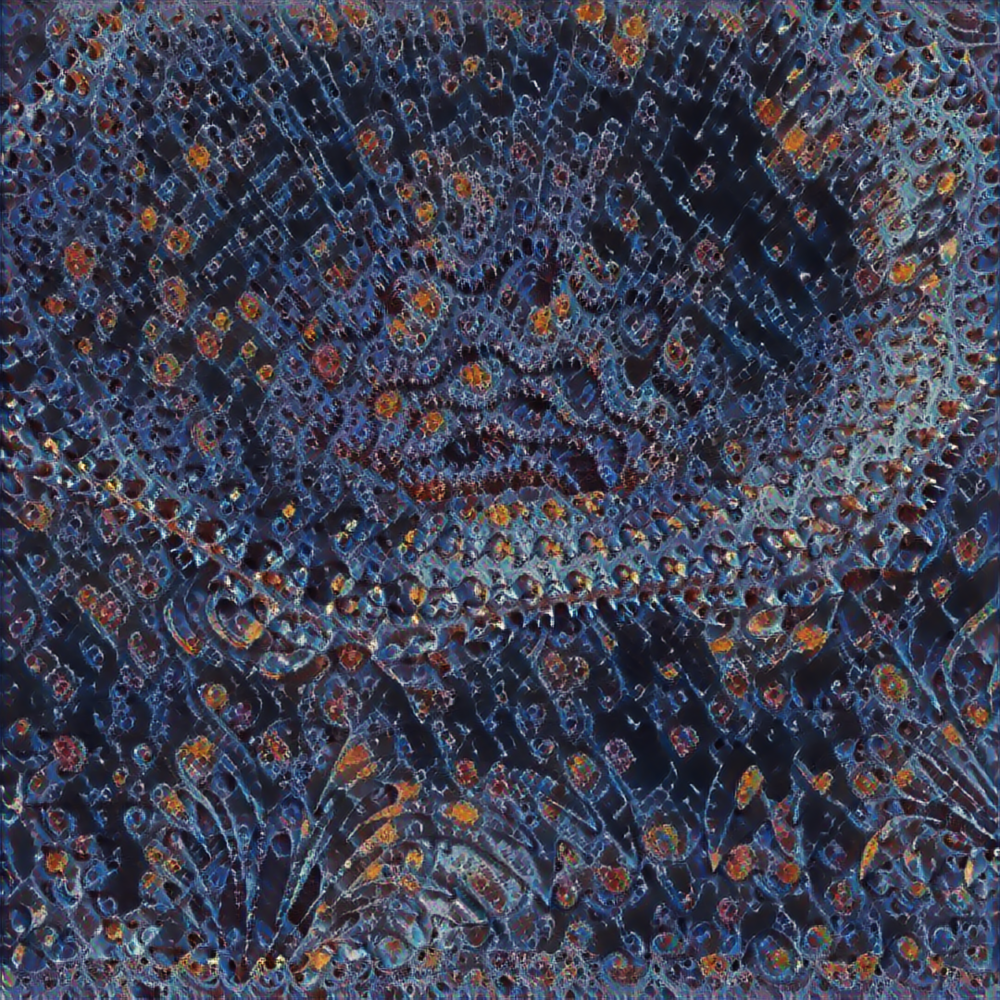

In [12]:
StyleTransfer("D:/fractals/hole/new000001.bmp", styles_path+stylepicked)

## Style transfer from one folder into another

In [34]:
batch("D:/fractals/hole/","D:/fractalrenderOut/")

D:\Users\ben__\Anaconda3\envs\tensorflow-gpu-2.0\lib\site-packages\ipykernel_launcher.py:57: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


# Video from frames in folder

In [35]:


now = str(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

render_path = "D:/fractalrenderOut/"
fileList = []
for file in os.listdir(render_path):
    if file.startswith("style"):
        complete_path = render_path + file
        fileList.append(complete_path)

writer = imageio.get_writer(render_path+'vidout' + now + '.mp4', fps=30)

for im in tqdm(fileList):
    writer.append_data(imageio.imread(im))
writer.close()

print(render_path+'vidout' + now + '.mp4')


D:\Users\ben__\Anaconda3\envs\tensorflow-gpu-2.0\lib\site-packages\ipykernel_launcher.py:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  from ipykernel import kernelapp as app



D:/fractalrenderOut/vidout20200826-163138.mp4


# Video -> first frame -> style transfer for each style

### pick a style based on first frame result

D:\Users\ben__\Anaconda3\envs\tensorflow-gpu-2.0\lib\site-packages\ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


black white cat.jpg


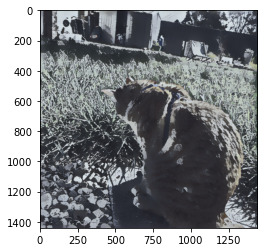

blue swerls.jpg


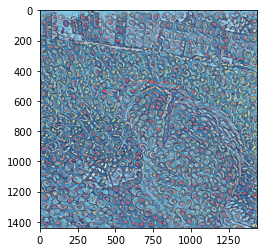

camal snail.jpg


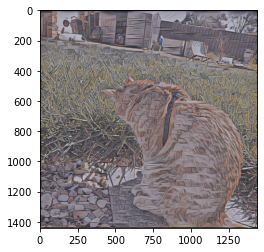

carpet.jpg


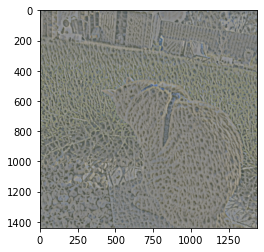

charcoal.jpg


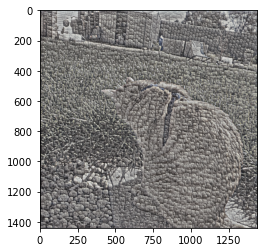

clay_embost.jpg


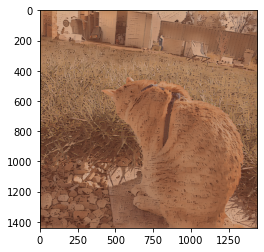

colourd rectangles.jpg


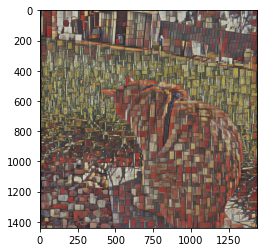

cubic.jpg


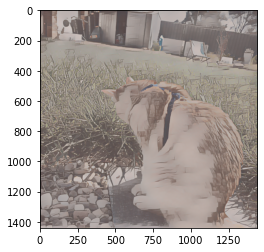

dragon mat.jpg


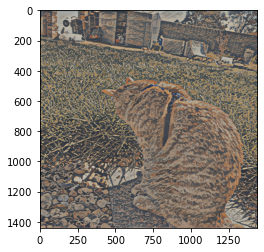

dragon screen.jpg


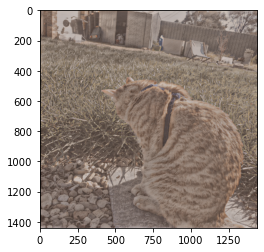

egg.jpg


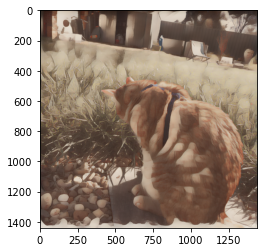

finger painting.jpg


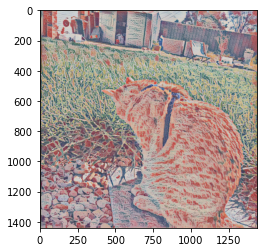

french sea thing.jpg


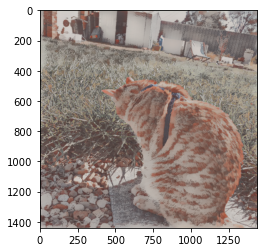

furry rocj.jpg


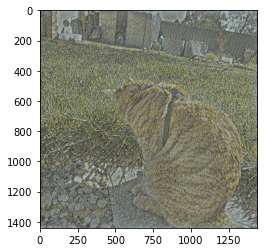

geomertry.jpg


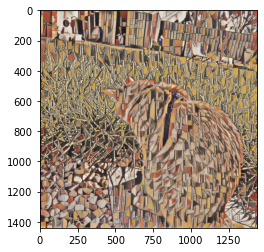

gold chest.jpg


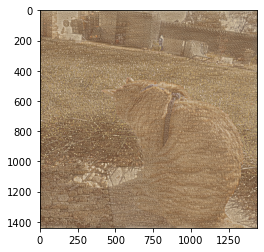

gothic.jpg


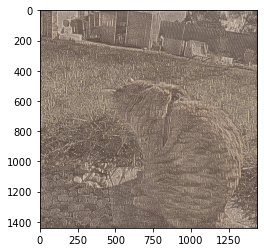

graffti dragon.jpg


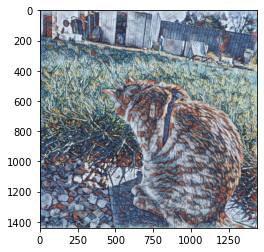

interfereance.jpg


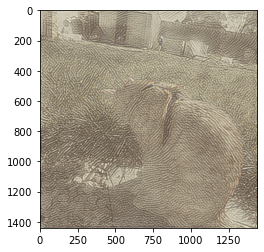

iso.jpg


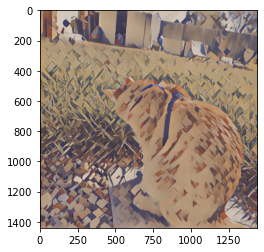

jellyfish.jpg


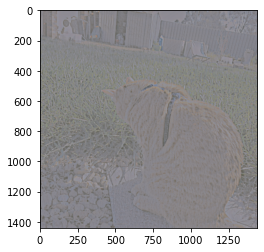

latace.jpg


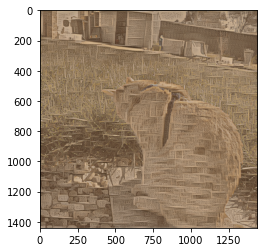

lionfish.jpg


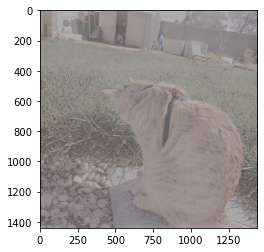

mech dragon.jpg


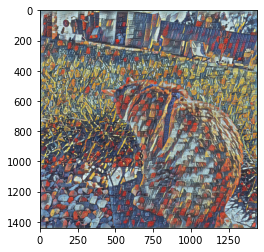

moss close.jpg


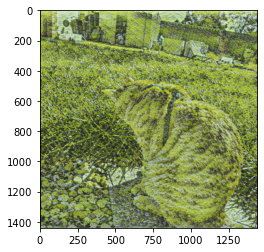

moss.jpg


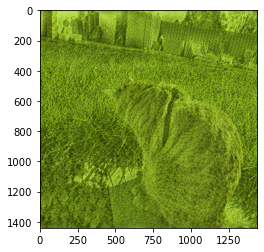

mushroom.jpg


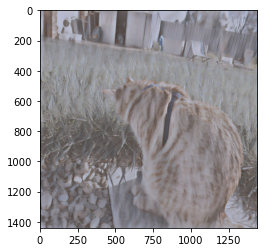

neon frog.jpg


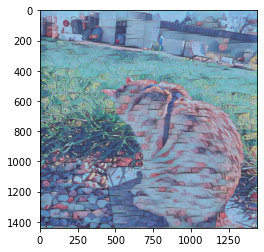

neon lady.jpg


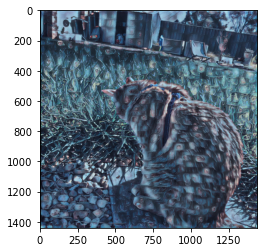

neon orange blue.jpg


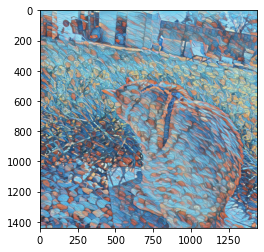

neonknot.jpg


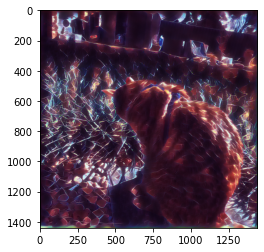

orbits.jpg


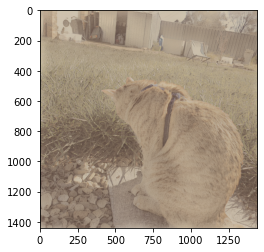

pastals.jpg


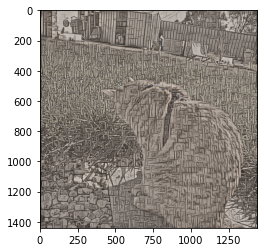

purple leaf.jpg


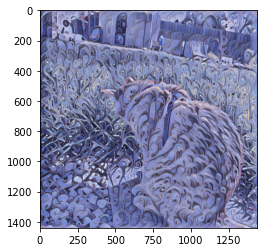

purple splater.jpg


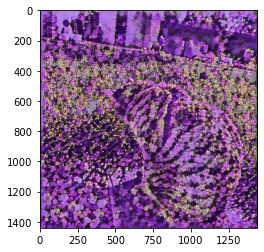

sea stuff.jpg


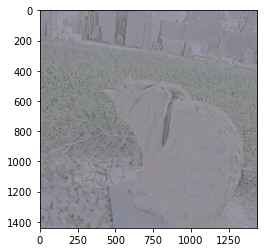

stained glass.jpg


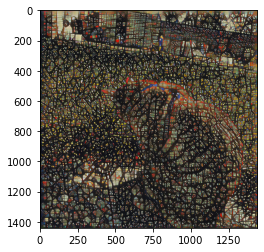

tiger.jpg


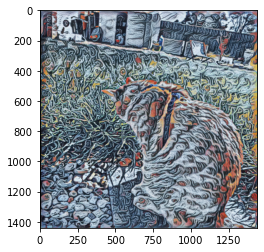

water wall.jpg


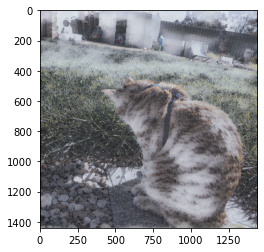

waves.jpg


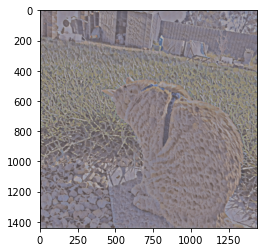

In [31]:

vid_in = 'D:/Users/ben/Dropbox/aiart/vidin/20200827_104123.mp4'
styles_path = "styles/"
styles = os.listdir(styles_path)

for style in tqdm(styles):
    

    style_image = imageprep(styles_path+style)
    reader = imageio.get_reader(vid_in)

    for i, im in enumerate(reader):
    
        content_image = np.asarray(im, dtype=np.float32)[np.newaxis, ...] / 255.
        stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
        break
    print(style)
    plt.imshow(tensor_to_imagelike(stylized_image))
    plt.show()


In [34]:


now = str(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


vid_in = 'D:/Users/ben/Dropbox/aiart/vidin/20200827_104123.mp4'
render_path = "D:/Users/ben/Dropbox/aiart/vidout/"

style_image = imageprep(styles_path+stylepicked)
reader = imageio.get_reader(vid_in)
writer = imageio.get_writer(render_path+'vidout' + now + '.mp4', fps=30)

for i, im in enumerate(tqdm(reader)):
    
    content_image = np.asarray(im, dtype=np.float32)[np.newaxis, ...] / 255.
    stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
    
    #writer.append_data(np.asarray(stylized_image, dtype = np.uint8)[1])
    writer.append_data(tensor_to_imagelike(stylized_image))

writer.close()

print(render_path+'vidout' + now + '.mp4')

D:\Users\ben__\Anaconda3\envs\tensorflow-gpu-2.0\lib\site-packages\ipykernel_launcher.py:11: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # This is added back by InteractiveShellApp.init_path()



D:/Users/ben/Dropbox/aiart/vidout/vidout20200827-150804.mp4
